In [1]:
%matplotlib inline
import matplotlib.pyplot as plt

from muon.deep_clustering.clustering import Config, Cluster
from muon.utils.subjects import Subjects

import os
import pickle
import math
import logging
import numpy as np
import pandas as pd
logger = logging.getLogger(__name__)

config = 'mnt/dec/dec_50_clusters/config_jupyter.json'
config = Config.load(config)
print(config.__dict__)
subjects = pickle.load(open(config.subjects, 'rb'))
print('Done loading subjects')
cluster = Cluster.create(subjects, config)

logger.info('Training model')
cluster.train()
pred = cluster.predictions
logger.info('Done training network')

20171214_13:43:16 INFO Initialized logging


/home/larai002/Zooniverse/repos/swap/conf
/home/larai002/Zooniverse/repos/swap/conf/swap.conf


Using TensorFlow backend.


{'nodes': [500, 500, 2000, 10], 'n_clusters': 50, 'update_interval': 140, 'ae_weights': 'mnt/dec/dec_output/ae_weights.h5', 'batch_size': 256, 'momentum': 0.9, 'save_dir': 'mnt/dec/dec_50_clusters', 'lr': 0.01, 'maxiter': 20000.0, 'tol': 0.001, 'subjects': 'mnt/dec/dec_output/subjects.pkl'}
Done loading subjects


20171214_13:43:39 INFO Training model


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input (InputLayer)           (None, 499)               0         
_________________________________________________________________
encoder_0 (Dense)            (None, 500)               250000    
_________________________________________________________________
encoder_1 (Dense)            (None, 500)               250500    
_________________________________________________________________
encoder_2 (Dense)            (None, 2000)              1002000   
_________________________________________________________________
encoder_3 (Dense)            (None, 10)                20010     
_________________________________________________________________
clustering (ClusteringLayer) (None, 50)                500       
Total params: 1,523,010
Trainable params: 1,523,010
Non-trainable params: 0
_________________________________________________________________


20171214_13:43:45 INFO Done training network


In [5]:
import csv
with open('mnt/muon-hunter-subjects-2.csv', 'r') as file:
    reader = csv.DictReader(file)
    for row in reader:
        i = int(row['subject_id'])
        if i in subjects.subjects:
            subjects[i].subject_set = int(row['subject_set_id'])
            subjects[i].subject_set

In [10]:
len(subjects.subjects)
subjects.list()[0].__dict__

{'charge': array([   0.        ,    0.        ,    0.        ,    0.        ,
           0.        ,    0.        ,    0.        ,    0.        ,
           0.        ,    0.        ,    0.        ,    0.        ,
           0.        ,    0.        ,    0.        ,    0.        ,
           0.        ,    0.        ,    0.        ,    0.        ,
           0.        ,    0.        ,    0.        ,    0.        ,
           0.        ,    0.        ,    0.        ,    0.        ,
           0.        ,    0.        ,    0.        ,    0.        ,
           0.        ,    0.        ,    0.        ,    0.        ,
           0.        ,    0.        ,    0.        ,    0.        ,
           0.        ,    0.        ,    0.        ,    0.        ,
           0.        ,    0.        ,    0.        ,    0.        ,
           0.        ,    0.        ,    0.        ,    0.        ,
           0.        ,    0.        ,    0.        ,    0.        ,
           0.        ,    0.        , 

In [6]:
def get_subject_set(self, subject_set):
    subjects = []
    for s in self.list():
#             print(s.subject_set)
        if s.subject_set == subject_set:
            subjects.append(s.id)

    return self.subset(subjects)

def get_run(_subjects, run):
    ids = []
    for s in _subjects.list():
        if s.event[0] == run:
            ids.append(s.id)
    return _subjects.subset(ids)

In [7]:
import math
from IPython.display import display
def plot_set(subjects):
    
    s = len(subjects)
    w = min(s, 10)
    l = math.ceil(s/w)
    
    fig = plt.figure(figsize=(2*w,4*l))
    fig.subplots_adjust(left=0, right=1, bottom=0, top=.95, hspace=.02, wspace=.01)
    
    data = []
    for i, s in enumerate(subjects.list()):
        j = math.floor(i/w) * w + i + 1
        ax = fig.add_subplot(2*l, w, j)
        ax.axis('off')
        ax.set_title('%d id %d' % (i, s.id))
        s.plot(ax)
        
        ax = fig.add_subplot(2*l, w, j + w)
        ax.axis('off')
        ax.imshow(s.load_image())
        
#         data.append((s.id, *s.event[:2]))
        
#     data = pd.DataFrame(data, columns=['subject', 'run', 'event'])
#     display(data)

    return fig


def event_data(subjects):
    data = []
    for s in subjects.list():
        data.append((s.id, *s.event, s.subject_set))
    return pd.DataFrame(data, columns=['id', 'run', 'evt', 'tel', 'subject_set'])

def subject_indexes(subjects, indexes):
    ids = []
    subl = subjects.list()
    for i in indexes:
        ids.append(subl[i].id)
    return subjects.subset(ids)

In [32]:
sample_1 = get_subject_set(subjects, 8450)._sample_s(50)

number of subjects 27307


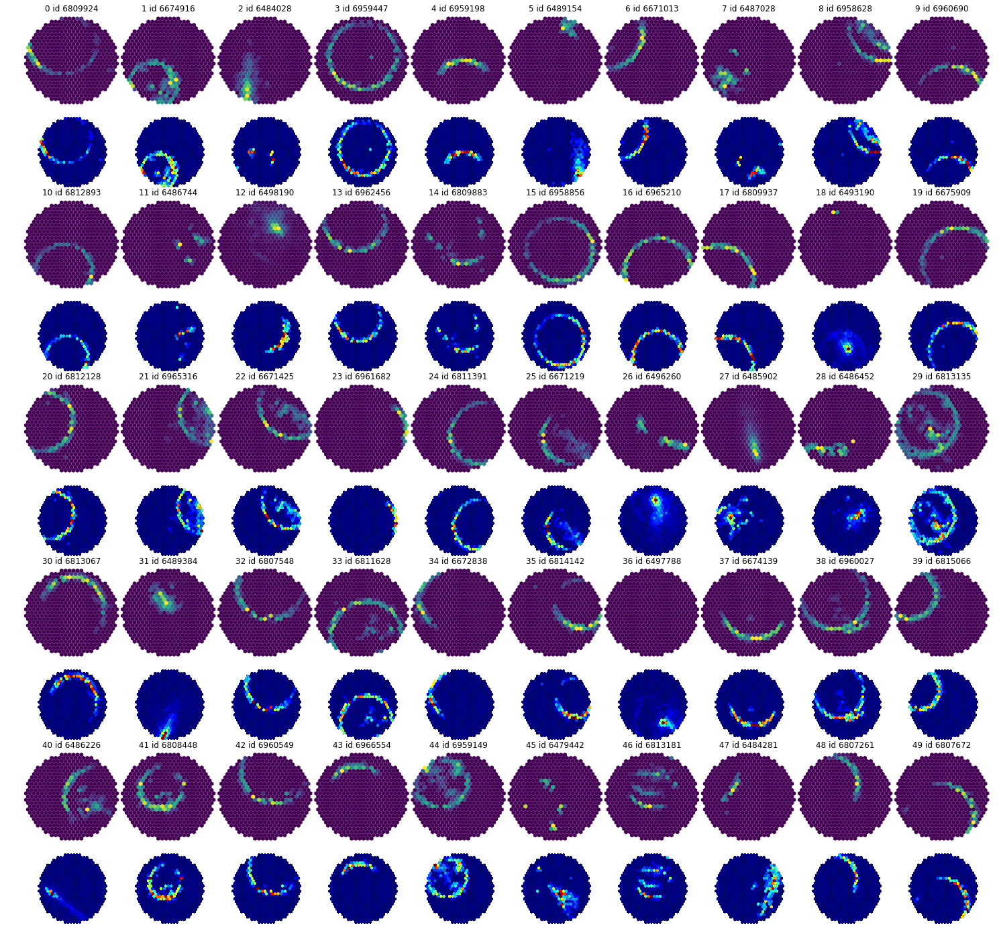

In [37]:
plot_set(sample_1)
plt.show()

In [53]:
indexes = [2, 5, 7, 12, 18, 26, 27, 28, 31, 36, 40, 45, 47]
s = subject_indexes(sample_1, indexes)
event_data(s)

,id,run,evt,tel,subject_set
0,6484028,81634,130056,2,8450
1,6489154,81634,138501,1,8450
2,6487028,81634,11043,1,8450
3,6498190,81634,135971,2,8450
4,6493190,81634,135172,2,8450
5,6496260,81634,94738,1,8450
6,6485902,81634,37258,0,8450
7,6486452,81634,64130,0,8450
8,6489384,81634,106955,1,8450
9,6497788,81634,98585,1,8450


In [54]:
sample_2 = get_run(subjects, 81634)._sample_s(50)

number of subjects 13968


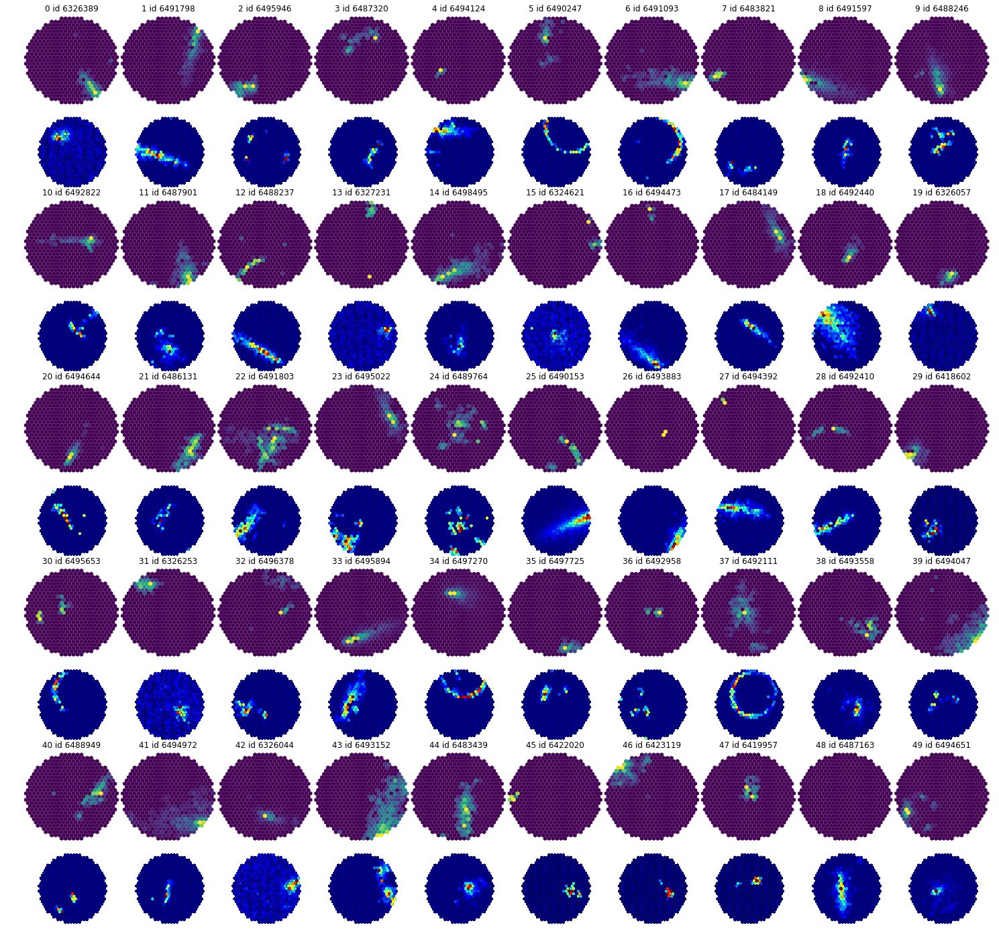

In [55]:
plot_set(sample_2)
plt.show()

In [56]:
event_data(sample_2)

,id,run,evt,tel,subject_set
0,6326389,81634,550761,0,8447
1,6491798,81634,6170,1,8450
2,6495946,81634,68531,1,8450
3,6487320,81634,15007,3,8450
4,6494124,81634,31048,0,8450
5,6490247,81634,10934,2,8450
6,6491093,81634,46304,2,8450
7,6483821,81634,132861,0,8450
8,6491597,81634,54964,0,8450
9,6488246,81634,126646,1,8450


In [61]:
print(len(get_run(subjects, 81634).labeled_subjects()))
print(len(subjects.labeled_subjects()))

2942
14670


In [94]:
# sample_3 = get_run(subjects, 81784)._sample_s(100)
# sample_3 = sample_3.subset(sorted(sample_3.subject_ids()))

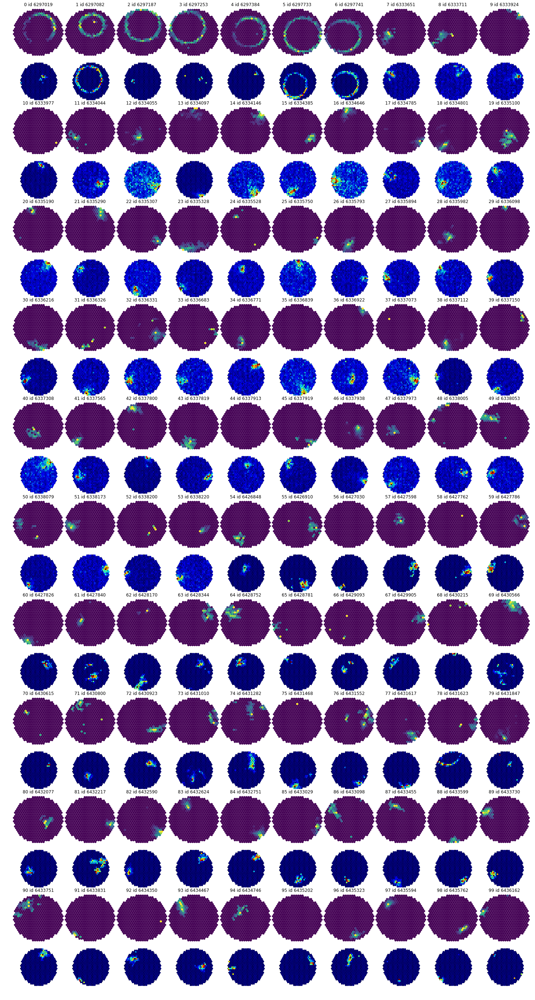

In [95]:
plot_set(sample_3)
plt.show()

In [68]:
event_data(sample_3)

,id,run,evt,tel,subject_set
0,6335528,81784,344300,0,8447
1,6338053,81784,75359,2,8447
2,6297082,81784,150846,3,8446
3,6427826,81784,14747,1,7872
4,6336098,81784,423939,2,8447
5,6335307,81784,316607,1,8447
6,6337565,81784,619468,3,8447
7,6297741,81784,6283,0,8446
8,6433730,81784,544652,1,7872
9,6427598,81784,193982,2,7872


number of subjects 4307
number of subjects 3387
number of subjects 3402
number of subjects 3502
number of subjects 3554
number of subjects 3423
number of subjects 4511
number of subjects 13968
number of subjects 1962
number of subjects 4219
number of subjects 3877
number of subjects 6161
number of subjects 1000
number of subjects 5995
number of subjects 14789
run 78573


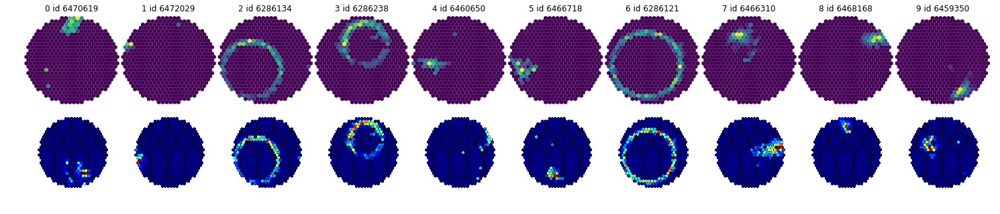

,id,run,evt,tel,subject_set
0,6470619,78573,596599,1,7872
1,6472029,78573,723880,1,7872
2,6286134,78573,561403,2,8446
3,6286238,78573,629914,1,8446
4,6460650,78573,360158,0,7872
5,6466718,78573,42376,2,7872
6,6286121,78573,549047,2,8446
7,6466310,78573,115992,1,7872
8,6468168,78573,195667,3,7872
9,6459350,78573,257988,0,7872


run 78576


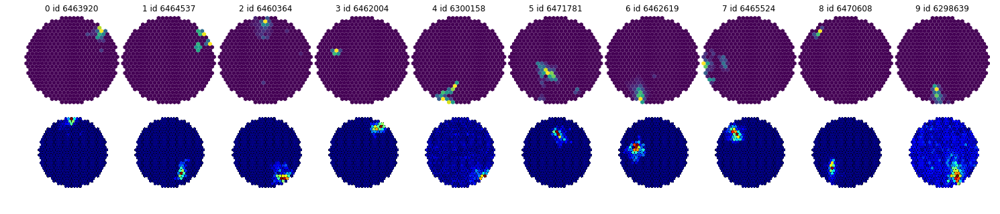

,id,run,evt,tel,subject_set
0,6463920,78576,420525,1,7872
1,6464537,78576,711703,0,7872
2,6460364,78576,636107,3,7872
3,6462004,78576,313448,3,7872
4,6300158,78576,759681,2,8447
5,6471781,78576,528087,0,7872
6,6462619,78576,141273,1,7872
7,6465524,78576,262889,2,7872
8,6470608,78576,242361,1,7872
9,6298639,78576,49390,2,8447


run 78596


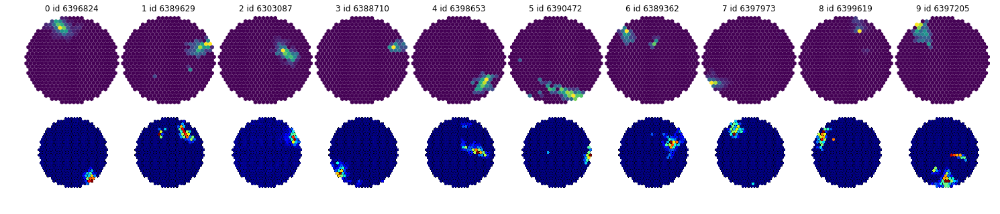

,id,run,evt,tel,subject_set
0,6396824,78596,295601,0,7872
1,6389629,78596,149092,2,7872
2,6303087,78596,367105,1,8447
3,6388710,78596,49842,1,7872
4,6398653,78596,489132,3,7872
5,6390472,78596,240352,1,7872
6,6389362,78596,121237,2,7872
7,6397973,78596,422177,3,7872
8,6399619,78596,587627,3,7872
9,6397205,78596,333164,3,7872


run 78597


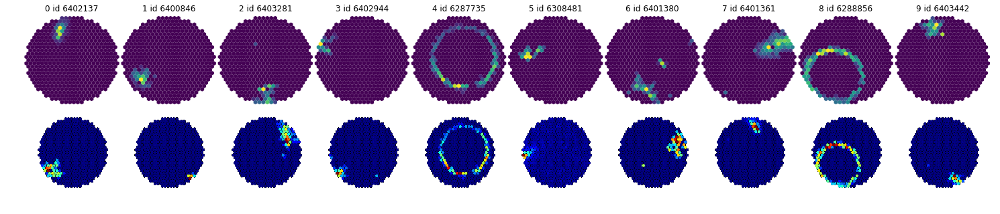

,id,run,evt,tel,subject_set
0,6402137,78597,386891,0,7872
1,6400846,78597,22020,0,7872
2,6403281,78597,558784,1,7872
3,6402944,78597,505730,3,7872
4,6287735,78597,171001,3,8446
5,6308481,78597,342480,2,8447
6,6401380,78597,269824,1,7872
7,6401361,78597,266632,1,7872
8,6288856,78597,64653,3,8446
9,6403442,78597,587706,0,7872


run 78598


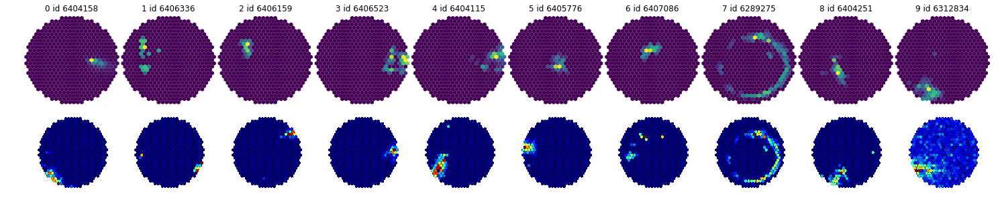

,id,run,evt,tel,subject_set
0,6404158,78598,150905,1,7872
1,6406336,78598,459908,2,7872
2,6406159,78598,43791,0,7872
3,6406523,78598,485023,2,7872
4,6404115,78598,145156,0,7872
5,6405776,78598,389091,0,7872
6,6407086,78598,553089,1,7872
7,6289275,78598,240544,2,8446
8,6404251,78598,162066,2,7872
9,6312834,78598,63030,0,8447


run 78599


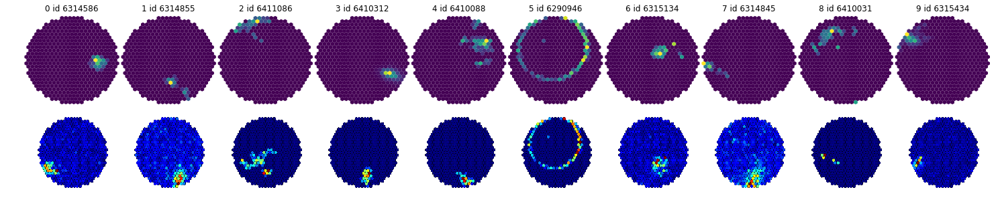

,id,run,evt,tel,subject_set
0,6314586,78599,408632,3,8447
1,6314855,78599,467506,1,8447
2,6411086,78599,70957,1,7872
3,6410312,78599,332250,2,7872
4,6410088,78599,306925,0,7872
5,6290946,78599,40962,0,8446
6,6315134,78599,520524,3,8447
7,6314845,78599,465046,3,8447
8,6410031,78599,300766,3,7872
9,6315434,78599,584694,1,8447


run 81496


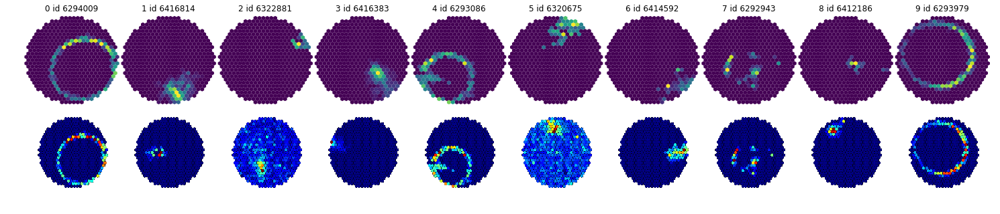

,id,run,evt,tel,subject_set
0,6294009,81496,565924,3,8446
1,6416814,81496,515596,0,7872
2,6322881,81496,582888,2,8447
3,6416383,81496,481030,2,7872
4,6293086,81496,189668,0,8446
5,6320675,81496,26776,3,8447
6,6414592,81496,347445,1,7872
7,6292943,81496,123997,3,8446
8,6412186,81496,16224,1,7872
9,6293979,81496,553392,1,8446


run 81634


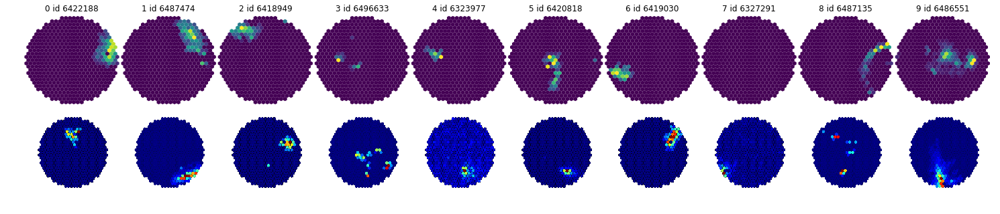

,id,run,evt,tel,subject_set
0,6422188,81634,46004,1,7872
1,6487474,81634,103835,3,8450
2,6418949,81634,138376,0,7872
3,6496633,81634,108066,2,8450
4,6323977,81634,187362,0,8447
5,6420818,81634,317350,1,7872
6,6419030,81634,147277,1,7872
7,6327291,81634,678703,0,8447
8,6487135,81634,38629,1,8450
9,6486551,81634,29785,1,8450


run 81635


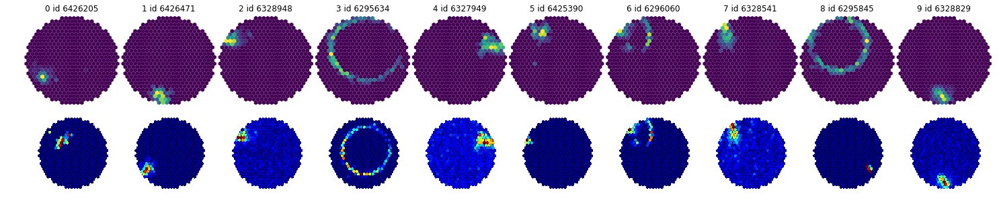

,id,run,evt,tel,subject_set
0,6426205,81635,35712,1,7872
1,6426471,81635,64886,2,7872
2,6328948,81635,81967,2,8447
3,6295634,81635,367333,2,8446
4,6327949,81635,155842,2,8447
5,6425390,81635,167082,0,7872
6,6296060,81635,7840,2,8446
7,6328541,81635,245436,1,8447
8,6295845,81635,534350,3,8446
9,6328829,81635,64886,3,8447


run 81783


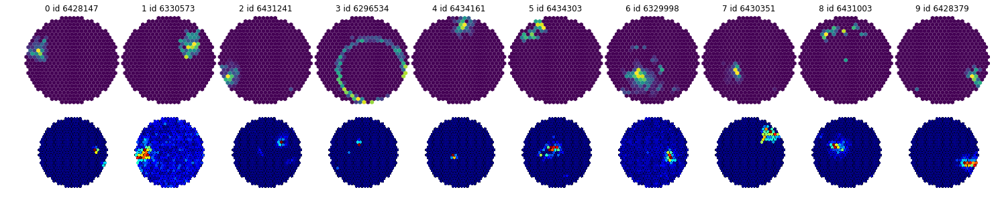

,id,run,evt,tel,subject_set
0,6428147,81783,94917,1,7872
1,6330573,81783,33105,3,8447
2,6431241,81783,225313,1,7872
3,6296534,81783,381233,3,8446
4,6434161,81783,646686,0,7872
5,6434303,81783,477690,0,7872
6,6329998,81783,242660,2,8447
7,6430351,81783,29828,3,7872
8,6431003,81783,637231,3,7872
9,6428379,81783,26975,1,7872


run 81784


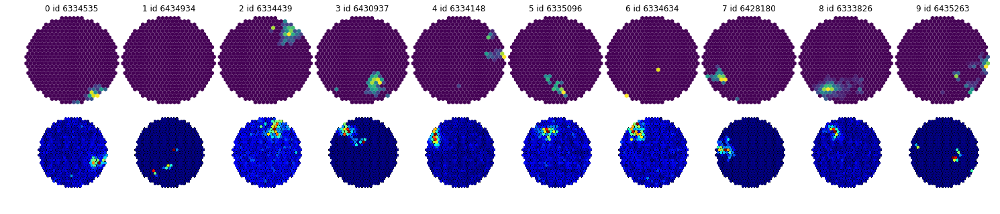

,id,run,evt,tel,subject_set
0,6334535,81784,218866,1,8447
1,6434934,81784,566506,2,7872
2,6334439,81784,206343,1,8447
3,6430937,81784,409935,0,7872
4,6334148,81784,169716,2,8447
5,6335096,81784,288464,0,8447
6,6334634,81784,229229,2,8447
7,6428180,81784,5778,0,7872
8,6333826,81784,12735,2,8447
9,6435263,81784,38726,1,7872


run 84628


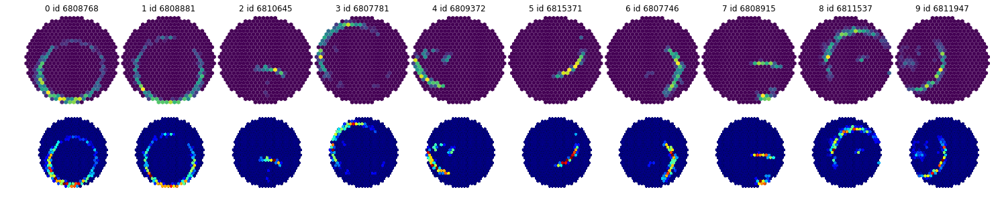

,id,run,evt,tel,subject_set
0,6808768,84628,417941,3,8450
1,6808881,84628,10806,1,8450
2,6810645,84628,404037,3,8450
3,6807781,84628,592403,0,8450
4,6809372,84628,345294,1,8450
5,6815371,84628,635232,1,8450
6,6807746,84628,192550,2,8450
7,6808915,84628,268312,1,8450
8,6811537,84628,740048,0,8450
9,6811947,84628,693650,1,8450


run 84647


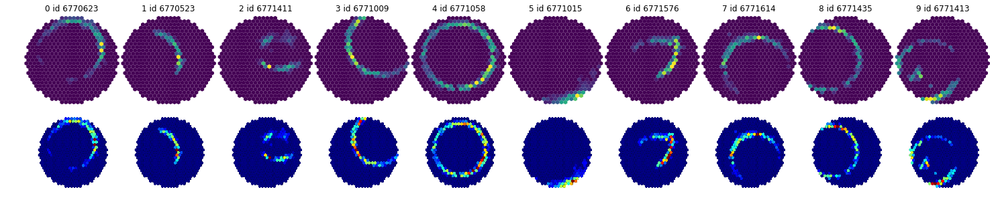

,id,run,evt,tel,subject_set
0,6770623,84647,219449,2,8450
1,6770523,84647,93052,0,8450
2,6771411,84647,311327,1,8450
3,6771009,84647,399474,3,8450
4,6771058,84647,151001,1,8450
5,6771015,84647,318874,0,8450
6,6771576,84647,687577,3,8450
7,6771614,84647,179231,2,8450
8,6771435,84647,512508,2,8450
9,6771413,84647,444558,1,8450


run 85005


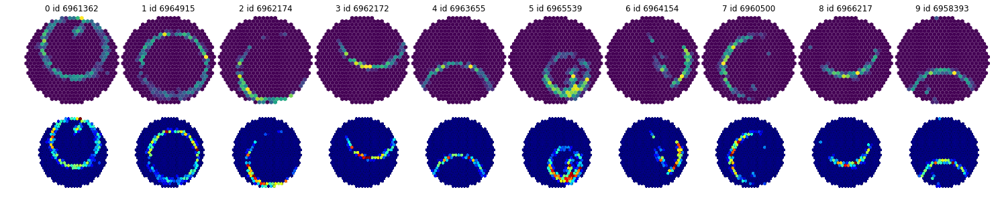

,id,run,evt,tel,subject_set
0,6961362,85005,292237,0,8450
1,6964915,85005,712945,3,8450
2,6962174,85005,30320,2,8450
3,6962172,85005,67251,2,8450
4,6963655,85005,500145,3,8450
5,6965539,85005,147298,3,8450
6,6964154,85005,77177,0,8450
7,6960500,85005,362857,3,8450
8,6966217,85005,668970,1,8450
9,6958393,85005,364935,0,8450


run 85061


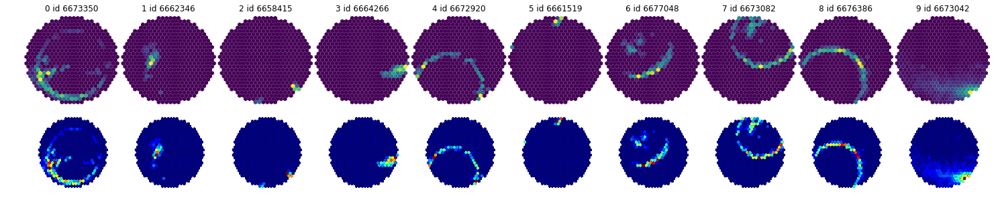

,id,run,evt,tel,subject_set
0,6673350,85061,480693,3,8450
1,6662346,85061,5202,2,8451
2,6658415,85061,3696,3,8451
3,6664266,85061,7584,0,8451
4,6672920,85061,311832,2,8450
5,6661519,85061,6761,3,8451
6,6677048,85061,256879,3,8450
7,6673082,85061,41581,0,8450
8,6676386,85061,68591,1,8450
9,6673042,85061,569403,1,8450


In [71]:
runs = [78573, 78576, 78596, 78597, 78598, 78599, 81496, 81634, 81635, 81783, 81784, 84628, 84647, 85005, 85061]
samples = [(i, get_run(subjects, i)._sample_s(10)) for i in runs]

for i, sample in samples:
    print('run %d' % i)
    plot_set(sample)
    plt.show()
    
    display(event_data(sample))

[5749, 5750, 5751, 7872, 8434, 8446, 8447, 8450, 8451]
number of subjects 0
number of subjects 0
number of subjects 0
number of subjects 22367
number of subjects 0
number of subjects 5538
number of subjects 12844
number of subjects 27307
number of subjects 10001
subject_set 7872


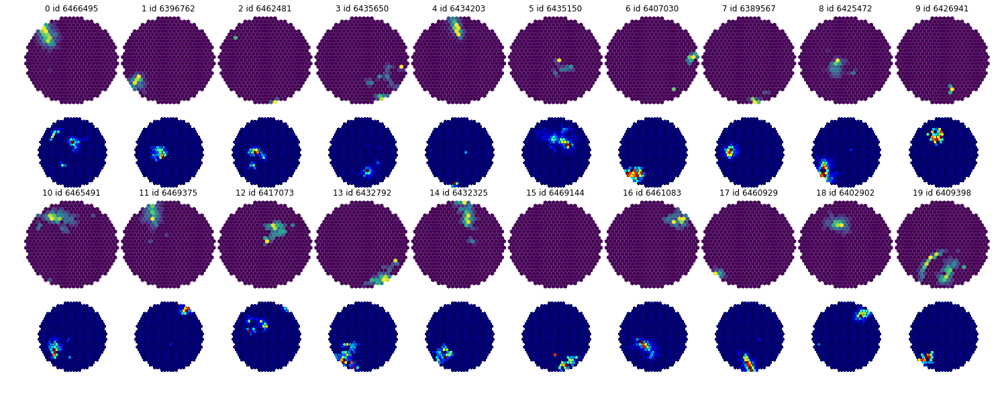

,id,run,evt,tel,subject_set
0,6466495,78576,501351,1,7872
1,6396762,78596,288995,3,7872
2,6462481,78573,720979,2,7872
3,6435650,81784,614791,1,7872
4,6434203,81783,75394,1,7872
5,6435150,81784,438578,0,7872
6,6407030,78598,545240,0,7872
7,6389567,78596,143990,2,7872
8,6425472,81635,177922,0,7872
9,6426941,81783,103446,0,7872


subject_set 8446


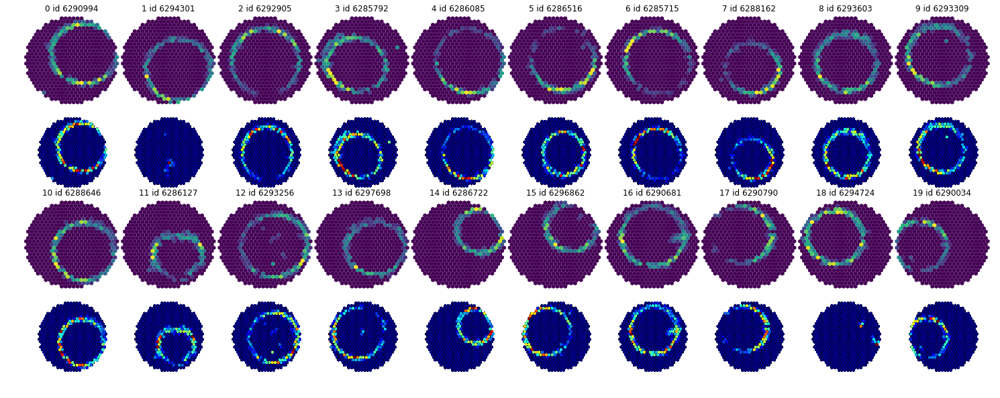

,id,run,evt,tel,subject_set
0,6290994,78599,430692,3,8446
1,6294301,81634,156508,1,8446
2,6292905,81496,108200,1,8446
3,6285792,78573,277530,2,8446
4,6286085,78573,523385,0,8446
5,6286516,78573,770568,2,8446
6,6285715,78573,221808,1,8446
7,6288162,78597,370172,2,8446
8,6293603,81496,406076,0,8446
9,6293309,81496,28370,0,8446


subject_set 8447


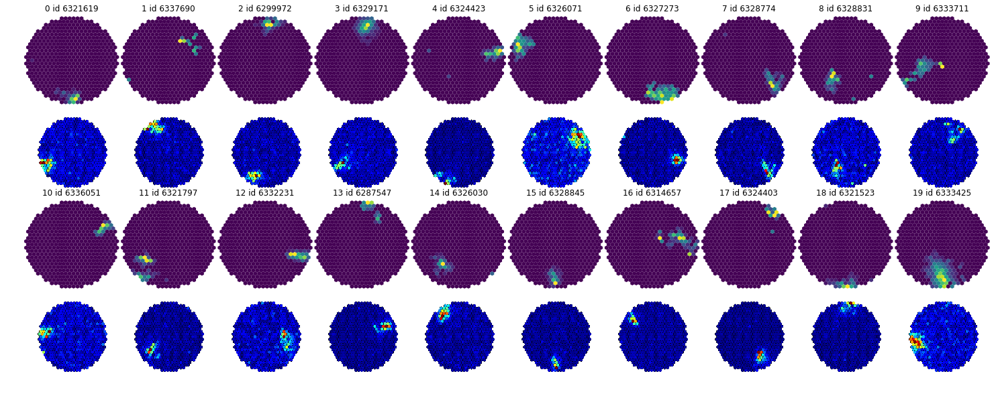

,id,run,evt,tel,subject_set
0,6321619,81496,403123,1,8447
1,6337690,81784,640292,1,8447
2,6299972,78576,737260,0,8447
3,6329171,81783,115757,2,8447
4,6324423,81634,252343,2,8447
5,6326071,81634,499244,2,8447
6,6327273,81634,676303,1,8447
7,6328774,81635,57593,3,8447
8,6328831,81635,65057,2,8447
9,6333711,81784,11049,3,8447


subject_set 8450


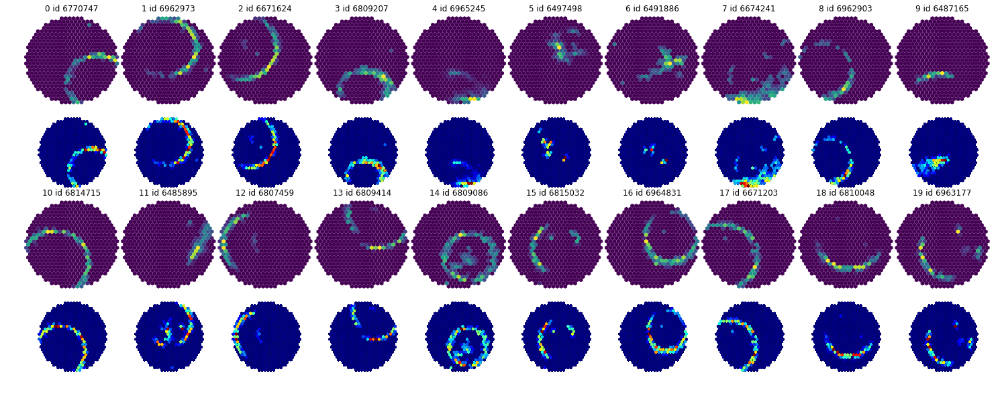

,id,run,evt,tel,subject_set
0,6770747,84647,141398,1,8450
1,6962973,85005,5642,3,8450
2,6671624,85061,588129,1,8450
3,6809207,84628,345967,1,8450
4,6965245,85005,147456,2,8450
5,6497498,81634,119885,2,8450
6,6491886,81634,127539,1,8450
7,6674241,85061,79679,0,8450
8,6962903,85005,600383,3,8450
9,6487165,81634,128859,1,8450


subject_set 8451


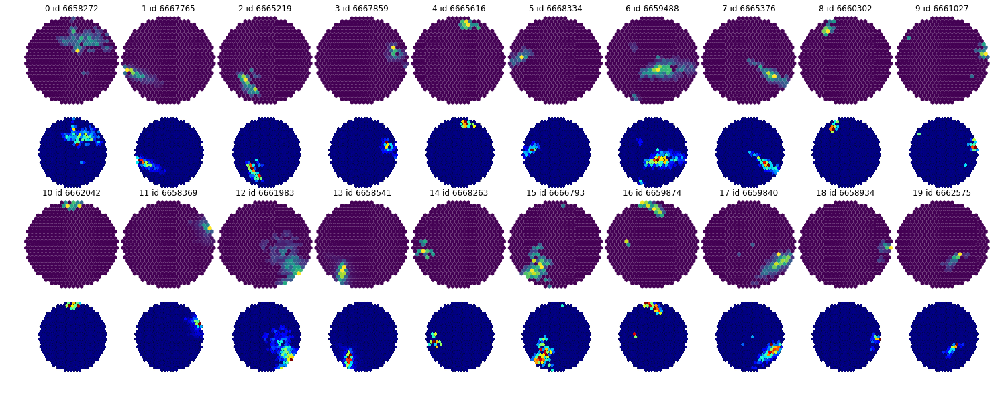

,id,run,evt,tel,subject_set
0,6658272,85061,5156,0,8451
1,6667765,85061,8530,0,8451
2,6665219,85061,25,0,8451
3,6667859,85061,2742,1,8451
4,6665616,85061,1507,3,8451
5,6668334,85061,2056,0,8451
6,6659488,85061,5866,2,8451
7,6665376,85061,408,1,8451
8,6660302,85061,6861,2,8451
9,6661027,85061,375,1,8451


In [77]:
subject_sets = sorted([7872, 5751, 8450, 8451, 8434, 5749, 8446, 8447, 5750])
print(subject_sets)
samples = [(i, get_subject_set(subjects, i)._sample_s(20)) for i in subject_sets]

for i, sample in samples:
    if len(sample) == 0:
        continue
    print('subject_set %d' % i)
    plot_set(sample)
    plt.show()
    
    display(event_data(sample))

subject set 8447
number of subjects 12844


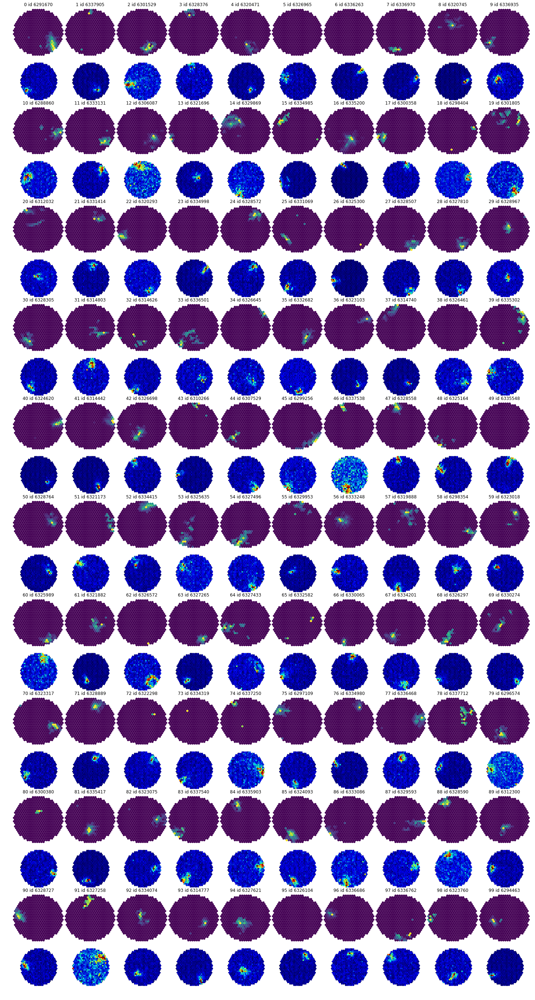

,id,run,evt,tel,subject_set
0,6291670,78573,552941,1,8447
1,6337905,81784,666476,3,8447
2,6301529,78596,216172,3,8447
3,6328376,81635,219221,0,8447
4,6320471,81496,23569,1,8447
5,6326965,81634,632680,1,8447
6,6336263,81784,444165,1,8447
7,6336970,81784,536688,0,8447
8,6320745,81496,277581,3,8447
9,6336935,81784,533140,0,8447


In [78]:
print('subject set %d' % 8447)
sample = get_subject_set(subjects, 8447)._sample_s(100)
plot_set(sample)
plt.show()

display(event_data(sample))

subject set 8451
number of subjects 10001


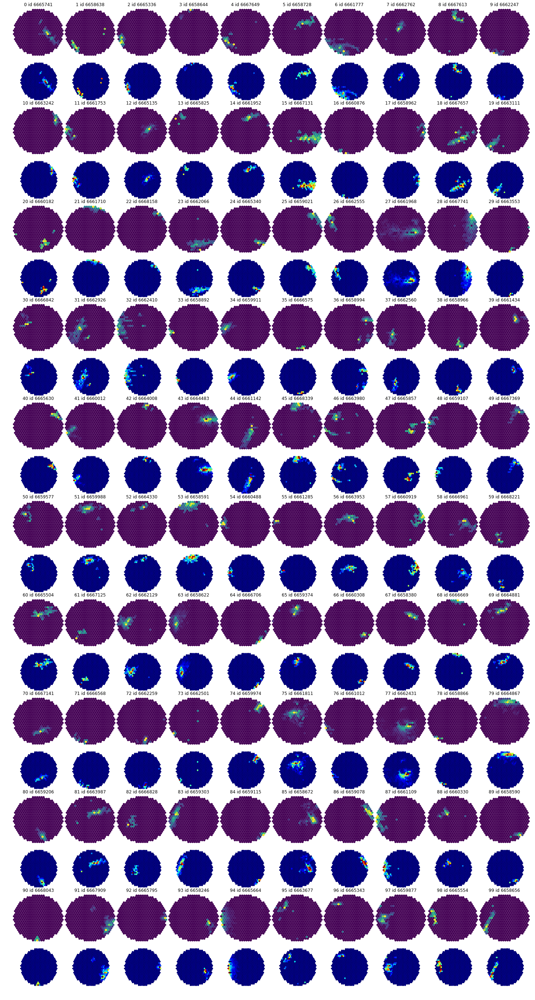

,id,run,evt,tel,subject_set
0,6665741,85061,2504,3,8451
1,6658638,85061,455,2,8451
2,6665336,85061,1082,3,8451
3,6658644,85061,1199,1,8451
4,6667649,85061,7273,1,8451
5,6658728,85061,8359,0,8451
6,6661777,85061,1864,3,8451
7,6662762,85061,5494,2,8451
8,6667613,85061,1170,3,8451
9,6662247,85061,2321,1,8451


In [79]:
i=8451
print('subject set %d' % i)
sample = get_subject_set(subjects, i)._sample_s(100)
plot_set(sample)
plt.show()

display(event_data(sample))

In [16]:
# print([s.id for s in sample_1.list()])
# print([s.id for s in sample_2.list()])
# print([s.id for s in sample_3.list()])

import json

def dump():
    with open(samples.json, 'w') as file:
        data = {
            'sample_1': sample_1.subject_ids(),
            'sample_2': sample_2.subject_ids(),
            'sample_3': sample_3.subject_ids(),
        }
        json.dump(data, file)
        
def load():
    with open('samples.json', 'r') as file:
        data = json.load(file)
        data = {k: subjects.subset(v) for k, v in data.items()}
        print(data)
        globals().update(data)
        
# with open('samples.json', 'w') as file:
#     data = {
#         'sample_1': [6809924, 6674916, 6484028, 6959447, 6959198, 6489154, 6671013, 6487028, 6958628, 6960690, 6812893, 6486744, 6498190, 6962456, 6809883, 6958856, 6965210, 6809937, 6493190, 6675909, 6812128, 6965316, 6671425, 6961682, 6811391, 6671219, 6496260, 6485902, 6486452, 6813135, 6813067, 6489384, 6807548, 6811628, 6672838, 6814142, 6497788, 6674139, 6960027, 6815066, 6486226, 6808448, 6960549, 6966554, 6959149, 6479442, 6813181, 6484281, 6807261, 6807672],
#         'sample_2': [6326389, 6491798, 6495946, 6487320, 6494124, 6490247, 6491093, 6483821, 6491597, 6488246, 6492822, 6487901, 6488237, 6327231, 6498495, 6324621, 6494473, 6484149, 6492440, 6326057, 6494644, 6486131, 6491803, 6495022, 6489764, 6490153, 6493883, 6494392, 6492410, 6418602, 6495653, 6326253, 6496378, 6495894, 6497270, 6497725, 6492958, 6492111, 6493558, 6494047, 6488949, 6494972, 6326044, 6493152, 6483439, 6422020, 6423119, 6419957, 6487163, 6494651],
#         'sample_3': [6335528, 6338053, 6297082, 6427826, 6336098, 6335307, 6337565, 6297741, 6433730, 6427598, 6426910, 6334055, 6335328, 6431617, 6297187, 6335100, 6433029, 6430215, 6333651, 6431468, 6433599, 6432590, 6297019, 6431847, 6337073, 6337112, 6427030, 6427786, 6337819, 6431010, 6434350, 6338005, 6334785, 6337913, 6335750, 6433751, 6430800, 6337973, 6297733, 6333977, 6435323, 6337938, 6338173, 6338079, 6336771, 6336839, 6336922, 6429093, 6432751, 6433455, 6430615, 6434746, 6334385, 6433098, 6435762, 6333924, 6334097, 6430923, 6427840, 6431552, 6297253, 6333711, 6335793, 6429905, 6337150, 6427762, 6336216, 6334646, 6335190, 6434467, 6336683, 6337800, 6334801, 6435594, 6297384, 6432077, 6335894, 6430566, 6335982, 6338220, 6435202, 6337308, 6431282, 6432624, 6426848, 6431623, 6428781, 6436162, 6334146, 6337919, 6334044, 6428752, 6428170, 6338200, 6428344, 6336326, 6336331, 6432217, 6433831, 6335290]  
#     }
#     json.dump(data, file)

load()
event_data(sample_1)


{'sample_1': <muon.utils.subjects.Subjects object at 0x7feb17c01160>, 'sample_3': <muon.utils.subjects.Subjects object at 0x7feb17c01780>, 'sample_2': <muon.utils.subjects.Subjects object at 0x7feb17c01b38>}


,id,run,evt,tel,subject_set
0,6809924,84628,193598,1,8450
1,6674916,85061,85982,3,8450
2,6484028,81634,130056,2,8450
3,6959447,85005,218257,2,8450
4,6959198,85005,535770,1,8450
5,6489154,81634,138501,1,8450
6,6671013,85061,562576,3,8450
7,6487028,81634,11043,1,8450
8,6958628,85005,56237,1,8450
9,6960690,85005,356903,1,8450


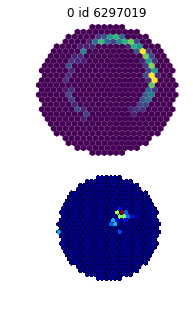

In [90]:
plot_set(subjects.subset([6297019,6297082]))
plt.show()

run 81634
number of subjects 13968


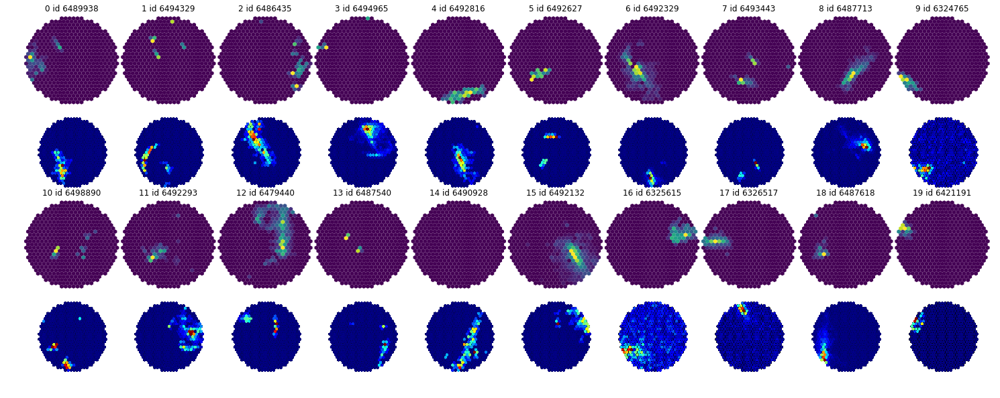

,id,run,evt,tel,subject_set
0,6489938,81634,37826,3,8450
1,6494329,81634,74875,2,8450
2,6486435,81634,96864,1,8450
3,6494965,81634,92725,0,8450
4,6492816,81634,40427,0,8450
5,6492627,81634,122149,0,8450
6,6492329,81634,1671,0,8450
7,6493443,81634,36268,1,8450
8,6487713,81634,9431,0,8450
9,6324765,81634,3029,1,8447


In [86]:
i=81634
print('run %d' % i)
sample = get_run(subjects, i)._sample_s(20)
plot_set(sample)
plt.show()

display(event_data(sample))

In [89]:
import csv
with open('data-81784.csv', 'w') as file:
    writer = csv.DictWriter(file, fieldnames=['subject', 'run', 'evt', 'tel', 'subject_set'])
    writer.writeheader()
    for s in sample_3.list():
        writer.writerow({'subject': s.id, 'run': s.event[0], 'evt': s.event[1], 'tel': s.event[2], 'subject_set': s.subject_set})